# Heart Disease Prediction

The target variable is specified as Heart Disease, where 'Presence' indicates a positive heart disease and 'Absence' indicates a negative heart disease.

The dataset consists of the following columns:
- Age
- Sex: Male (1) or female (0)
- Chest Pain Type: From 1 to 4
- BP
- Cholesterol
- FBS over 120: Fasting Blood Sugar level over 120 (yes (1) or no (0))
- EKG results
- Max HR
- Exercise angina
- ST depression
- Slope of ST
- Number of vessels fluro
- Thallium
- Heart Disease: Presence or Absence heart disease

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

import warnings
warnings.simplefilter(action="ignore")

In [2]:
df = pd.read_csv("./dataset/Heart_Disease.csv")

In [3]:
def check_df(dataframe, head=5):
    print("-----Shape-----")
    print(dataframe.shape)
    print("----- Types -----")
    print(dataframe.dtypes)
    print("----- Head -----")
    print(dataframe.head(head))
    print("----- Null -----")
    print(dataframe.isnull().sum())

check_df(df)

-----Shape-----
(270, 14)
----- Types -----
Age                          int64
Sex                          int64
Chest pain type              int64
BP                           int64
Cholesterol                  int64
FBS over 120                 int64
EKG results                  int64
Max HR                       int64
Exercise angina              int64
ST depression              float64
Slope of ST                  int64
Number of vessels fluro      int64
Thallium                     int64
Heart Disease               object
dtype: object
----- Head -----
   Age  Sex  Chest pain type   BP  Cholesterol  FBS over 120  EKG results  \
0   70    1                4  130          322             0            2   
1   67    0                3  115          564             0            2   
2   57    1                2  124          261             0            0   
3   64    1                4  128          263             0            0   
4   74    0                2  120          269    

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,270.0,54.433333,9.109067,29.0,48.0,55.0,61.0,77.0
Sex,270.0,0.677778,0.468195,0.0,0.0,1.0,1.0,1.0
Chest pain type,270.0,3.174074,0.950090,1.0,3.0,3.0,4.0,4.0
BP,270.0,131.344444,17.861608,94.0,120.0,130.0,140.0,200.0
Cholesterol,270.0,249.659259,51.686237,126.0,213.0,245.0,280.0,564.0
FBS over 120,270.0,0.148148,0.355906,0.0,0.0,0.0,0.0,1.0
EKG results,270.0,1.022222,0.997891,0.0,0.0,2.0,2.0,2.0
Max HR,270.0,149.677778,23.165717,71.0,133.0,153.5,166.0,202.0
Exercise angina,270.0,0.329630,0.470952,0.0,0.0,0.0,1.0,1.0
ST depression,270.0,1.050000,1.145210,0.0,0.0,0.8,1.6,6.2


In [5]:
target_col = ['Heart Disease']
expl_col = [col for col in df.columns if col != 'Heart Disease']

## Target Variable Analysis

          Heart Disease      Ratio
Absence             150  55.555556
Presence            120  44.444444


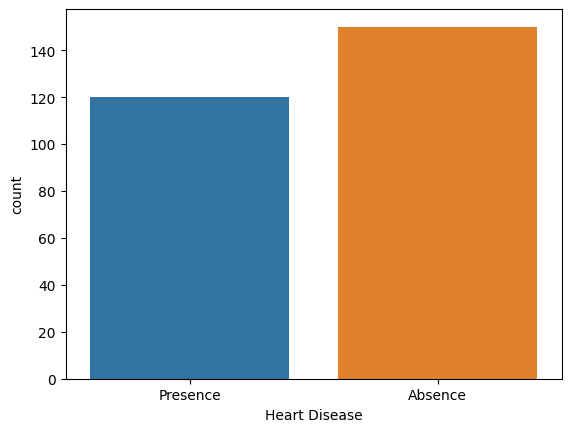

In [6]:
print(pd.DataFrame({'Heart Disease': df['Heart Disease'].value_counts(), "Ratio": 100 * df['Heart Disease'].value_counts() / len(df)}))
sns.countplot(x=df['Heart Disease'], data=df)
plt.show()

In [7]:
label_encoder = LabelEncoder()

label_encoder.fit(df['Heart Disease'])

df['Heart Disease Encoded'] = label_encoder.transform(df['Heart Disease'])

# If you want to map Absence to 0 and Presence to 1 explicitly
# you can create a dictionary and use the map function
mapping = {'Absence': 0, 'Presence': 1}
df['Heart Disease Encoded'] = df['Heart Disease'].map(mapping)

df.head()

,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium,Heart Disease,Heart Disease Encoded
0,70,1,4,130,322,0,2,109,0,2.4,2,3,3,Presence,1
1,67,0,3,115,564,0,2,160,0,1.6,2,0,7,Absence,0
2,57,1,2,124,261,0,0,141,0,0.3,1,0,7,Presence,1
3,64,1,4,128,263,0,0,105,1,0.2,2,1,7,Absence,0
4,74,0,2,120,269,0,2,121,1,0.2,1,1,3,Absence,0


In [8]:
target_col = ['Heart Disease', 'Heart Disease Encoded']
expl_col = [col for col in df.columns if col != 'Heart Disease' and col != 'Heart Disease Encoded']

## Dependent Variables Analysis

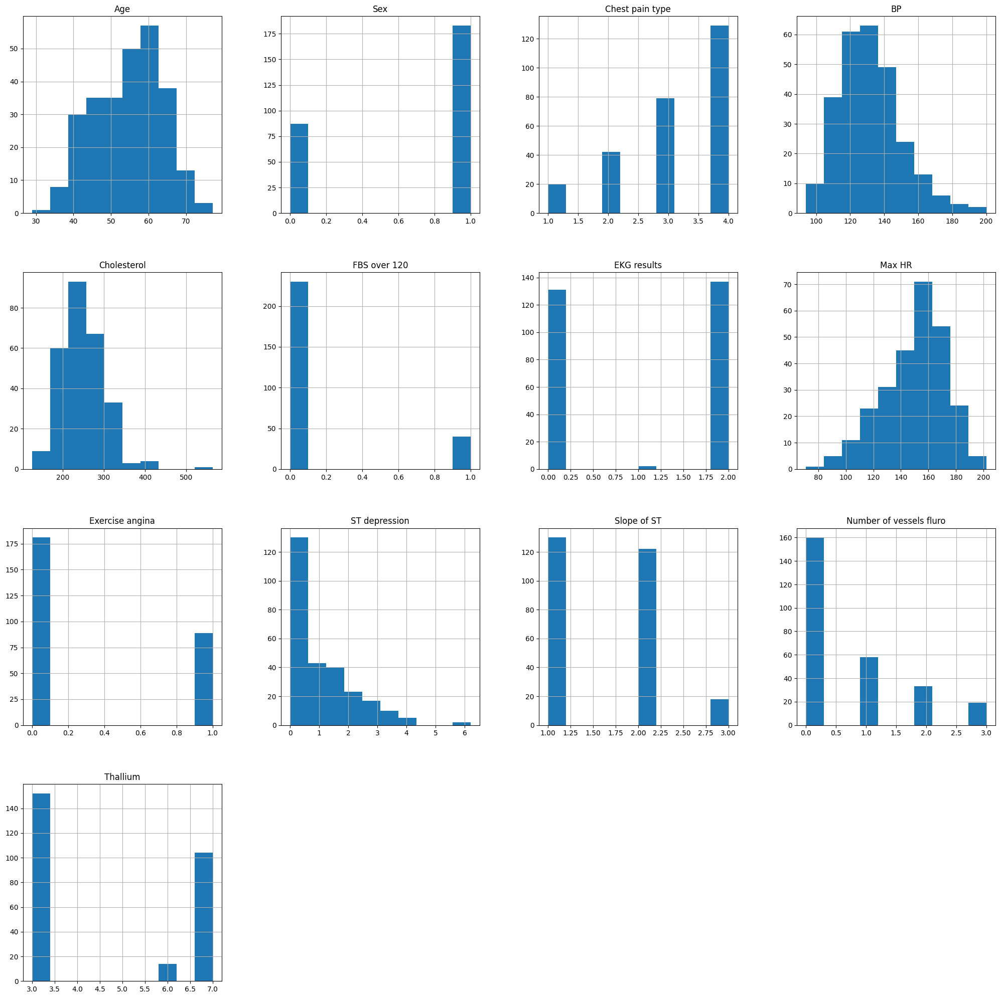

In [9]:
df[expl_col].hist(figsize=(25, 25))
plt.title('Explanatory Variables')
plt.show()

## Variable Correlation Analysis

In [10]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [11]:
corr = df[expl_col].corr()
corr

,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium
Age,1.000,-0.094,0.097,0.273,0.220,0.123,0.128,-0.402,0.098,0.194,0.160,0.356,0.106
Sex,-0.094,1.000,0.035,-0.063,-0.202,0.042,0.039,-0.076,0.180,0.097,0.051,0.087,0.391
Chest pain type,0.097,0.035,1.000,-0.043,0.090,-0.099,0.074,-0.318,0.353,0.167,0.137,0.226,0.263
BP,0.273,-0.063,-0.043,1.000,0.173,0.156,0.116,-0.039,0.083,0.223,0.142,0.086,0.132
Cholesterol,0.220,-0.202,0.090,0.173,1.000,0.025,0.168,-0.019,0.078,0.028,-0.006,0.127,0.029
FBS over 120,0.123,0.042,-0.099,0.156,0.025,1.000,0.053,0.022,-0.004,-0.026,0.044,0.124,0.049
EKG results,0.128,0.039,0.074,0.116,0.168,0.053,1.000,-0.075,0.095,0.120,0.161,0.114,0.007
Max HR,-0.402,-0.076,-0.318,-0.039,-0.019,0.022,-0.075,1.000,-0.381,-0.349,-0.387,-0.265,-0.253
Exercise angina,0.098,0.180,0.353,0.083,0.078,-0.004,0.095,-0.381,1.000,0.275,0.256,0.153,0.321
ST depression,0.194,0.097,0.167,0.223,0.028,-0.026,0.120,-0.349,0.275,1.000,0.610,0.255,0.324


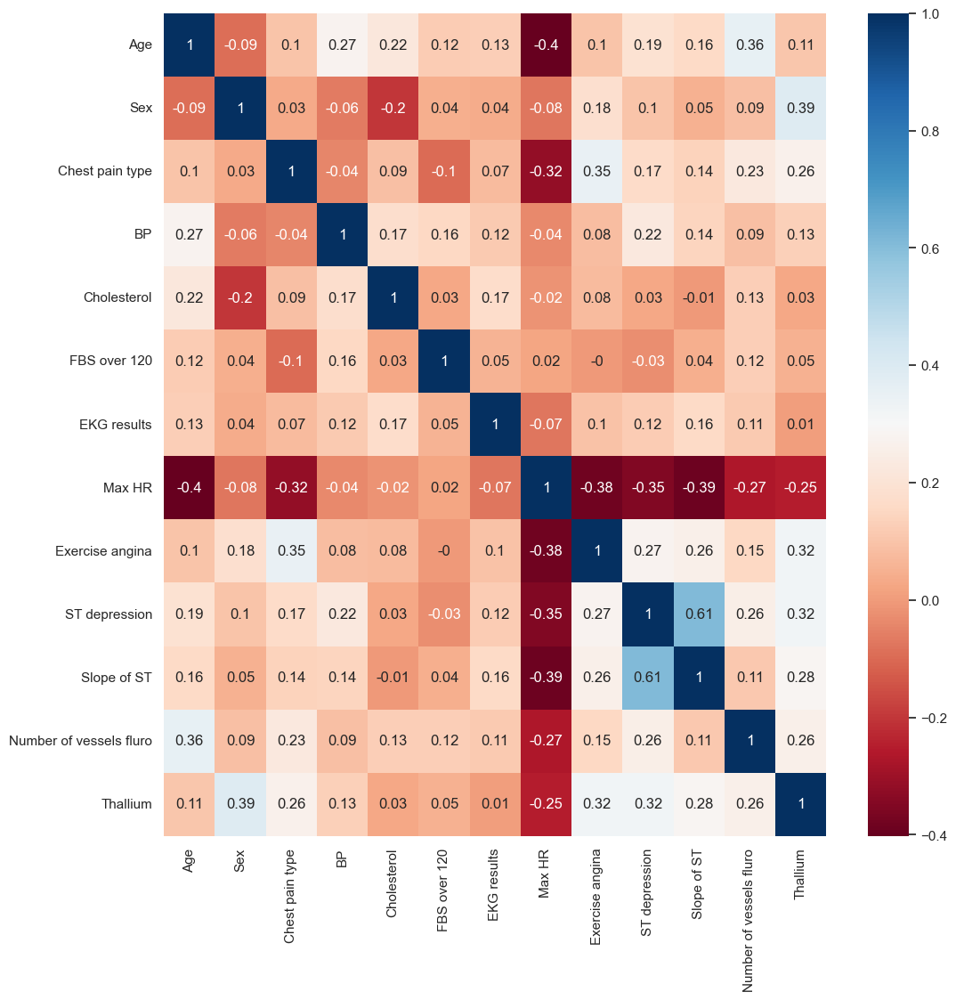

In [12]:
sns.set(rc={"figure.figsize": (12, 12)})
corr_values = corr.round(2)
sns.heatmap(corr, cmap="RdBu", annot=corr_values)
plt.show()

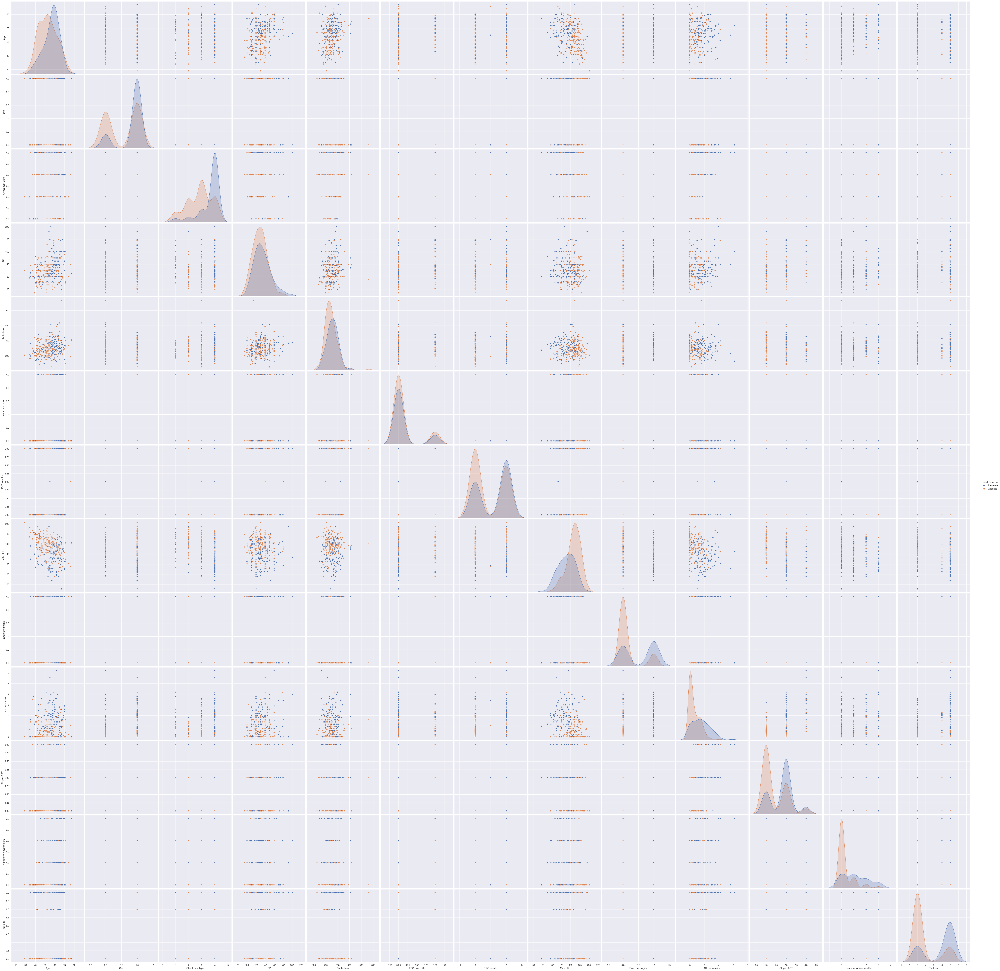

In [13]:
sns.pairplot(data=df, vars=expl_col, hue='Heart Disease', height=5)
plt.show()

## Building Model

In [14]:
# Dependent/target variable
y = df["Heart Disease Encoded"]

# Independent/explanatory variables
X = df.drop(target_col, axis=1)

# Splitting into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)

### Logistic Regression

In [15]:
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)

In [16]:
lr_acc = accuracy_score(lr_pred, y_test)
lr_recall = recall_score(lr_pred, y_test)
lr_prec = precision_score(lr_pred, y_test)
lr_f1 = f1_score(lr_pred, y_test)
lr_auc = roc_auc_score(lr_pred, y_test)

In [17]:
print("-----Logistic Regression-----")
print(f"Accuracy: {round(lr_acc, 4)}")
print(f"Recall: {round(lr_recall, 4)}")
print(f"Precision: {round(lr_prec, 4)}")
print(f"F1: {round(lr_f1, 4)}")
print(f"AUC: {round(lr_auc, 4)}")

-----Logistic Regression-----
Accuracy: 0.8519
Recall: 0.8333
Precision: 0.75
F1: 0.7895
AUC: 0.8472


### K-Nearest Neighbors (KNN)

In [18]:
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)

In [19]:
knn_acc = accuracy_score(knn_pred, y_test)
knn_recall = recall_score(knn_pred, y_test)
knn_prec = precision_score(knn_pred, y_test)
knn_f1 = f1_score(knn_pred, y_test)
knn_auc = roc_auc_score(knn_pred, y_test)

In [20]:
print("-----K-Nearest Neighbors (KNN)-----")
print(f"Accuracy: {round(knn_acc, 4)}")
print(f"Recall: {round(knn_recall, 4)}")
print(f"Precision: {round(knn_prec, 4)}")
print(f"F1: {round(knn_f1, 4)}")
print(f"AUC: {round(knn_auc, 4)}")

-----K-Nearest Neighbors (KNN)-----
Accuracy: 0.6667
Recall: 0.5556
Precision: 0.5
F1: 0.5263
AUC: 0.6389


### Decision Tree

In [21]:
dt_model = DecisionTreeClassifier(random_state=50).fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)

In [22]:
dt_acc = accuracy_score(dt_pred, y_test)
dt_recall = recall_score(dt_pred, y_test)
dt_prec = precision_score(dt_pred, y_test)
dt_f1 = f1_score(dt_pred, y_test)
dt_auc = roc_auc_score(dt_pred, y_test)

In [23]:
print("-----Decision Tree-----")
print(f"Accuracy: {round(dt_acc, 4)}")
print(f"Recall: {round(dt_recall, 4)}")
print(f"Precision: {round(dt_prec, 4)}")
print(f"F1: {round(dt_f1, 4)}")
print(f"AUC: {round(dt_auc, 4)}")

-----Decision Tree-----
Accuracy: 0.7037
Recall: 0.5909
Precision: 0.65
F1: 0.619
AUC: 0.6861


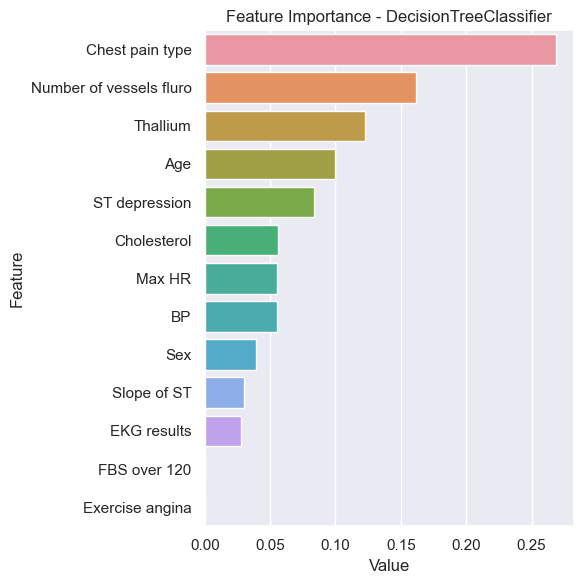

In [24]:
feature_imp = pd.DataFrame({'Value': dt_model.feature_importances_, 'Feature': X.columns})
plt.figure(figsize=(6, 6))
sns.set(font_scale=1)
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:len(X)])
plt.title(f'Feature Importance - {dt_model.__class__.__name__}')
plt.tight_layout()
plt.show()

### Random Forest

In [25]:
rf_model = RandomForestClassifier(random_state=50).fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

In [26]:
rf_acc = accuracy_score(rf_pred, y_test)
rf_recall = recall_score(rf_pred, y_test)
rf_prec = precision_score(rf_pred, y_test)
rf_f1 = f1_score(rf_pred, y_test)
rf_auc = roc_auc_score(rf_pred, y_test)

In [27]:
print("-----Random Forest-----")
print(f"Accuracy: {round(rf_acc, 4)}")
print(f"Recall: {round(rf_recall, 4)}")
print(f"Precision: {round(rf_prec, 4)}")
print(f"F1: {round(rf_f1, 4)}")
print(f"AUC: {round(rf_auc, 4)}")

-----Random Forest-----
Accuracy: 0.8148
Recall: 0.7778
Precision: 0.7
F1: 0.7368
AUC: 0.8056


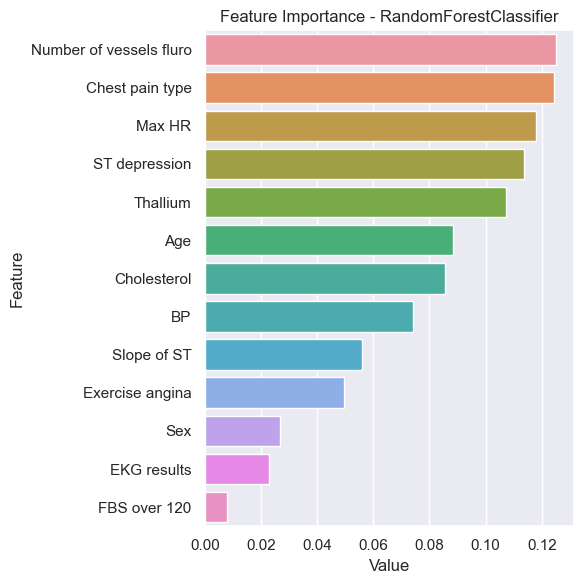

In [28]:
feature_imp = pd.DataFrame({'Value': rf_model.feature_importances_, 'Feature': X.columns})
plt.figure(figsize=(6, 6))
sns.set(font_scale=1)
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:len(X)])
plt.title(f'Feature Importance - {rf_model.__class__.__name__}')
plt.tight_layout()
plt.show()

### Support Vector

In [29]:
svc_model = SVC(random_state=50).fit(X_train, y_train)
svc_pred = svc_model.predict(X_test)

In [30]:
svc_acc = accuracy_score(svc_pred, y_test)
svc_recall = recall_score(svc_pred, y_test)
svc_prec = precision_score(svc_pred, y_test)
svc_f1 = f1_score(svc_pred, y_test)
svc_auc = roc_auc_score(svc_pred, y_test)

In [31]:
print("-----Support Vector-----")
print(f"Accuracy: {round(svc_acc, 4)}")
print(f"Recall: {round(svc_recall, 4)}")
print(f"Precision: {round(svc_prec, 4)}")
print(f"F1: {round(svc_f1, 4)}")
print(f"AUC: {round(svc_auc, 4)}")

-----Support Vector-----
Accuracy: 0.7222
Recall: 0.6471
Precision: 0.55
F1: 0.5946
AUC: 0.7019


### Gradient Boosting

In [32]:
gb_model = GradientBoostingClassifier().fit(X_train, y_train)
gb_pred = gb_model.predict(X_test)

In [33]:
gb_acc = accuracy_score(gb_pred, y_test)
gb_recall = recall_score(gb_pred, y_test)
gb_prec = precision_score(gb_pred, y_test)
gb_f1 = f1_score(gb_pred, y_test)
gb_auc = roc_auc_score(gb_pred, y_test)

In [34]:
print("-----Gradient Boosting-----")
print(f"Accuracy: {round(gb_acc, 4)}")
print(f"Recall: {round(gb_recall, 4)}")
print(f"Precision: {round(gb_prec, 4)}")
print(f"F1: {round(gb_f1, 4)}")
print(f"AUC: {round(gb_auc, 4)}")

-----Gradient Boosting-----
Accuracy: 0.8519
Recall: 0.8333
Precision: 0.75
F1: 0.7895
AUC: 0.8472


### XGBoost

In [35]:
xgb_model = XGBClassifier().fit(X_train, y_train)
xgb_pred = xgb_model.predict(X_test)

In [36]:
xgb_acc = accuracy_score(xgb_pred, y_test)
xgb_recall = recall_score(xgb_pred, y_test)
xgb_prec = precision_score(xgb_pred, y_test)
xgb_f1 = f1_score(xgb_pred, y_test)
xgb_auc = roc_auc_score(xgb_pred, y_test)

In [37]:
print("-----XG Boost-----")
print(f"Accuracy: {round(xgb_acc, 4)}")
print(f"Recall: {round(xgb_recall, 4)}")
print(f"Precision: {round(xgb_prec, 4)}")
print(f"F1: {round(xgb_f1, 4)}")
print(f"AUC: {round(xgb_auc, 4)}")

-----XG Boost-----
Accuracy: 0.8704
Recall: 0.8824
Precision: 0.75
F1: 0.8108
AUC: 0.8736


### Naive Bayes

In [38]:
nb_model = GaussianNB().fit(X_train, y_train)
nb_pred = nb_model.predict(X_test)

In [39]:
nb_acc = accuracy_score(nb_pred, y_test)
nb_recall = recall_score(nb_pred, y_test)
nb_prec = precision_score(nb_pred, y_test)
nb_f1 = f1_score(nb_pred, y_test)
nb_auc = roc_auc_score(nb_pred, y_test)

In [40]:
print("-----Naive Bayes-----")
print(f"Accuracy: {round(nb_acc, 4)}")
print(f"Recall: {round(nb_recall, 4)}")
print(f"Precision: {round(nb_prec, 4)}")
print(f"F1: {round(nb_f1, 4)}")
print(f"AUC: {round(nb_auc, 4)}")

-----Naive Bayes-----
Accuracy: 0.8704
Recall: 0.8095
Precision: 0.85
F1: 0.8293
AUC: 0.8593


### MLP Neural Network

In [41]:
nn_model = MLPClassifier().fit(X_train, y_train)
nn_pred = nn_model.predict(X_test)

In [42]:
nn_acc = accuracy_score(nn_pred, y_test)
nn_recall = recall_score(nn_pred, y_test)
nn_prec = precision_score(nn_pred, y_test)
nn_f1 = f1_score(nn_pred, y_test)
nn_auc = roc_auc_score(nn_pred, y_test)

In [43]:
print("-----MLP Neural Network-----")
print(f"Accuracy: {round(nn_acc, 4)}")
print(f"Recall: {round(nn_recall, 4)}")
print(f"Precision: {round(nn_prec, 4)}")
print(f"F1: {round(nn_f1, 4)}")
print(f"AUC: {round(nn_auc, 4)}")

-----MLP Neural Network-----
Accuracy: 0.7407
Recall: 0.625
Precision: 0.75
F1: 0.6818
AUC: 0.7292


## Hyperparameter Optimization

### Logistic Regression

In [44]:
lr_model = LogisticRegression(random_state=50)
parameters = {'C': [0.1, 1, 10],
              'penalty': ['l1', 'l2']}
lr_grid = GridSearchCV(lr_model, parameters, cv=5).fit(X_train, y_train)

best_lr_model = lr_grid.best_estimator_

In [45]:
lr_acc = lr_grid.best_score_
lr_recall = recall_score(best_lr_model.predict(X_test), y_test)
lr_prec = precision_score(best_lr_model.predict(X_test), y_test)
lr_f1 = f1_score(best_lr_model.predict(X_test), y_test)
lr_auc = roc_auc_score(best_lr_model.predict(X_test), y_test)

In [46]:
print("-----Logistic Regression * Hyperparameter Optimization-----")
print(f"Best Parameters: {lr_grid.best_params_}")
print(f"Accuracy: {round(lr_acc, 4)}")
print(f"Recall: {round(lr_recall, 4)}")
print(f"Precision: {round(lr_prec, 4)}")
print(f"F1: {round(lr_f1, 4)}")
print(f"AUC: {round(lr_auc, 4)}")

-----Logistic Regression * Hyperparameter Optimization-----
Best Parameters: {'C': 1, 'penalty': 'l2'}
Accuracy: 0.8427
Recall: 0.8333
Precision: 0.75
F1: 0.7895
AUC: 0.8472


### K-Nearest Neighbors (KNN)

In [47]:
knn_model = KNeighborsClassifier()
parameters = {'n_neighbors': [5, 10, 15],
              'weights': ['uniform', 'distance']}
knn_grid = GridSearchCV(knn_model, parameters, cv=5).fit(X_train, y_train)

best_knn_model = knn_grid.best_estimator_

In [48]:
knn_acc = knn_grid.best_score_
knn_recall = recall_score(best_knn_model.predict(X_test), y_test)
knn_prec = precision_score(best_knn_model.predict(X_test), y_test)
knn_f1 = f1_score(best_knn_model.predict(X_test), y_test)
knn_auc = roc_auc_score(best_knn_model.predict(X_test), y_test)

In [49]:
print("-----K-Nearest Neighbors (KNN) * Hyperparameter Optimization-----")
print(f"Best Parameters: {knn_grid.best_params_}")
print(f"Accuracy: {round(knn_acc, 4)}")
print(f"Recall: {round(knn_recall, 4)}")
print(f"Precision: {round(knn_prec, 4)}")
print(f"F1: {round(knn_f1, 4)}")
print(f"AUC: {round(knn_auc, 4)}")

-----K-Nearest Neighbors (KNN) * Hyperparameter Optimization-----
Best Parameters: {'n_neighbors': 15, 'weights': 'distance'}
Accuracy: 0.6715
Recall: 0.5
Precision: 0.55
F1: 0.5238
AUC: 0.6094


### Decision Tree

In [50]:
dt_model = DecisionTreeClassifier(random_state=50)
parameters = {'max_depth': [3, 5, 10],
              'min_samples_split': [5, 10, 15]}
dt_grid = GridSearchCV(dt_model, parameters, cv=5).fit(X_train, y_train)

best_dt_model = dt_grid.best_estimator_

In [51]:
dt_acc = dt_grid.best_score_
dt_recall = recall_score(best_dt_model.predict(X_test), y_test)
dt_prec = precision_score(best_dt_model.predict(X_test), y_test)
dt_f1 = f1_score(best_dt_model.predict(X_test), y_test)
dt_auc = roc_auc_score(best_dt_model.predict(X_test), y_test)

In [52]:
print("-----Decision Tree Classifier * Hyperparameter Optimization-----")
print(f"Best Parameters: {dt_grid.best_params_}")
print(f"Accuracy: {round(dt_acc, 4)}")
print(f"Recall: {round(dt_recall, 4)}")
print(f"Precision: {round(dt_prec, 4)}")
print(f"F1: {round(dt_f1, 4)}")
print(f"AUC: {round(dt_auc, 4)}")

-----Decision Tree Classifier * Hyperparameter Optimization-----
Best Parameters: {'max_depth': 5, 'min_samples_split': 15}
Accuracy: 0.7872
Recall: 0.6667
Precision: 0.7
F1: 0.6829
AUC: 0.7424


### Random Forest

In [53]:
rf_model = RandomForestClassifier(random_state=50)
parameters = {'n_estimators': [100, 200, 300],
              'max_depth': [3, 10, 15],
              'min_samples_split': [5, 10, 15]}
rf_grid = GridSearchCV(rf_model, parameters, cv=5).fit(X_train, y_train)

best_rf_model = rf_grid.best_estimator_

In [54]:
rf_acc = rf_grid.best_score_
rf_recall = recall_score(best_rf_model.predict(X_test), y_test)
rf_prec = precision_score(best_rf_model.predict(X_test), y_test)
rf_f1 = f1_score(best_rf_model.predict(X_test), y_test)
rf_auc = roc_auc_score(best_rf_model.predict(X_test), y_test)

In [55]:
print("-----Random Forest Classifier * Hyperparameter Optimization-----")
print(f"Best Parameters: {rf_grid.best_params_}")
print(f"Accuracy: {round(rf_acc, 4)}")
print(f"Recall: {round(rf_recall, 4)}")
print(f"Precision: {round(rf_prec, 4)}")
print(f"F1: {round(rf_f1, 4)}")
print(f"AUC: {round(rf_auc, 4)}")

-----Random Forest Classifier * Hyperparameter Optimization-----
Best Parameters: {'max_depth': 3, 'min_samples_split': 10, 'n_estimators': 300}
Accuracy: 0.8335
Recall: 0.8824
Precision: 0.75
F1: 0.8108
AUC: 0.8736


### Support Vector

In [56]:
svc_model = SVC(random_state=50)
parameters = {'C': [0.1, 1, 10],
              'kernel': ['linear', 'rbf']}
svc_grid = GridSearchCV(svc_model, parameters, cv=5).fit(X_train, y_train)

best_svc_model = svc_grid.best_estimator_

In [57]:
svc_acc = svc_grid.best_score_
svc_recall = recall_score(best_svc_model.predict(X_test), y_test)
svc_prec = precision_score(best_svc_model.predict(X_test), y_test)
svc_f1 = f1_score(best_svc_model.predict(X_test), y_test)
svc_auc = roc_auc_score(best_svc_model.predict(X_test), y_test)

In [58]:
print("-----Support Vector Classifier (SVC) * Hyperparameter Optimization-----")
print(f"Best Parameters: {svc_grid.best_params_}")
print(f"Accuracy: {round(svc_acc, 4)}")
print(f"Recall: {round(svc_recall, 4)}")
print(f"Precision: {round(svc_prec, 4)}")
print(f"F1: {round(svc_f1, 4)}")
print(f"AUC: {round(svc_auc, 4)}")

-----Support Vector Classifier (SVC) * Hyperparameter Optimization-----
Best Parameters: {'C': 0.1, 'kernel': 'linear'}
Accuracy: 0.8427
Recall: 0.8421
Precision: 0.8
F1: 0.8205
AUC: 0.8639


### Gradient Boosting

In [59]:
gb_model = GradientBoostingClassifier(random_state=50)
parameters = {'n_estimators': [50, 100, 200],
              'learning_rate': [0.1, 0.5, 1.0]}
gb_grid = GridSearchCV(gb_model, parameters, cv=5).fit(X_train, y_train)

best_gb_model = gb_grid.best_estimator_

In [60]:
gb_acc = gb_grid.best_score_
gb_recall = recall_score(best_gb_model.predict(X_test), y_test)
gb_prec = precision_score(best_gb_model.predict(X_test), y_test)
gb_f1 = f1_score(best_gb_model.predict(X_test), y_test)
gb_auc = roc_auc_score(best_gb_model.predict(X_test), y_test)

In [61]:
print("-----Gradient Boosting * Hyperparameter Optimization-----")
print(f"Best Parameters: {gb_grid.best_params_}")
print(f"Accuracy: {round(gb_acc, 4)}")
print(f"Recall: {round(gb_recall, 4)}")
print(f"Precision: {round(gb_prec, 4)}")
print(f"F1: {round(gb_f1, 4)}")
print(f"AUC: {round(gb_auc, 4)}")

-----Gradient Boosting * Hyperparameter Optimization-----
Best Parameters: {'learning_rate': 0.1, 'n_estimators': 50}
Accuracy: 0.8288
Recall: 0.7895
Precision: 0.75
F1: 0.7692
AUC: 0.8233


### XG Boost

In [62]:
xgb_model = XGBClassifier(random_state=50)
parameters = {'n_estimators': [50, 100, 200],
              'learning_rate': [0.1, 0.5, 1.0]}
xgb_grid = GridSearchCV(xgb_model, parameters, cv=5).fit(X_train, y_train)

best_gb_model = xgb_grid.best_estimator_

In [63]:
xgb_acc = accuracy_score(xgb_pred, y_test)
xgb_recall = recall_score(xgb_pred, y_test)
xgb_prec = precision_score(xgb_pred, y_test)
xgb_f1 = f1_score(xgb_pred, y_test)
xgb_auc = roc_auc_score(xgb_pred, y_test)

In [64]:
print("-----XG Boost * Hyperparameter Optimization-----")
print(f"Best Parameters: {xgb_grid.best_params_}")
print(f"Accuracy: {round(xgb_acc, 4)}")
print(f"Recall: {round(xgb_recall, 4)}")
print(f"Precision: {round(xgb_prec, 4)}")
print(f"F1: {round(xgb_f1, 4)}")
print(f"AUC: {round(xgb_auc, 4)}")

-----XG Boost * Hyperparameter Optimization-----
Best Parameters: {'learning_rate': 0.5, 'n_estimators': 50}
Accuracy: 0.8704
Recall: 0.8824
Precision: 0.75
F1: 0.8108
AUC: 0.8736


### Naive Bayes

In [65]:
nb_model = GaussianNB()
parameters = {'var_smoothing': np.logspace(0,-9, num=100)}
nb_grid = GridSearchCV(nb_model, parameters, cv=5).fit(X_train, y_train)

best_gb_model = nb_grid.best_estimator_

In [66]:
nb_acc = accuracy_score(nb_pred, y_test)
nb_recall = recall_score(nb_pred, y_test)
nb_prec = precision_score(nb_pred, y_test)
nb_f1 = f1_score(nb_pred, y_test)
nb_auc = roc_auc_score(nb_pred, y_test)

In [67]:
print("-----Naive Bayes * Hyperparameter Optimization-----")
print(f"Best Parameters: {nb_grid.best_params_}")
print(f"Accuracy: {round(nb_acc, 4)}")
print(f"Recall: {round(nb_recall, 4)}")
print(f"Precision: {round(nb_prec, 4)}")
print(f"F1: {round(nb_f1, 4)}")
print(f"AUC: {round(nb_auc, 4)}")

-----Naive Bayes * Hyperparameter Optimization-----
Best Parameters: {'var_smoothing': 0.0001232846739442066}
Accuracy: 0.8704
Recall: 0.8095
Precision: 0.85
F1: 0.8293
AUC: 0.8593


### MLP Neural Network

In [68]:
nn_model = MLPClassifier()
parameters = {'hidden_layer_sizes': [(10,), (20,)],
            'activation': ['tanh', 'relu'],
            'solver': ['sgd', 'adam'],
            'alpha': [0.0001, 0.05],
            'learning_rate': ['constant','adaptive']}
nn_grid = GridSearchCV(nn_model, parameters, cv=5).fit(X_train, y_train)

best_gb_model = nn_grid.best_estimator_

In [69]:
nn_acc = accuracy_score(nn_pred, y_test)
nn_recall = recall_score(nn_pred, y_test)
nn_prec = precision_score(nn_pred, y_test)
nn_f1 = f1_score(nn_pred, y_test)
nn_auc = roc_auc_score(nn_pred, y_test)

In [70]:
print("-----MLP Neural Network * Hyperparameter Optimization-----")
print(f"Best Parameters: {nn_grid.best_params_}")
print(f"Accuracy: {round(nn_acc, 4)}")
print(f"Recall: {round(nn_recall, 4)}")
print(f"Precision: {round(nn_prec, 4)}")
print(f"F1: {round(nn_f1, 4)}")
print(f"AUC: {round(nn_auc, 4)}")

-----MLP Neural Network * Hyperparameter Optimization-----
Best Parameters: {'activation': 'tanh', 'alpha': 0.05, 'hidden_layer_sizes': (20,), 'learning_rate': 'constant', 'solver': 'adam'}
Accuracy: 0.7407
Recall: 0.625
Precision: 0.75
F1: 0.6818
AUC: 0.7292


In [71]:
metrics = {
    "Model": ["Logistic Regression", "KNN", "Decision Tree", "Random Forest", "SVC", "Gradient Boosting", "XGBoost", "Naive Bayes", "MLP Neural Network"],
    "Accuracy": [lr_acc, knn_acc, dt_acc, rf_acc, svc_acc, gb_acc, xgb_acc, nb_acc, nn_acc],
    "Recall": [lr_recall, knn_recall, dt_recall, rf_recall, svc_recall, gb_recall, xgb_recall, nb_recall, nn_recall],
    "Precision": [lr_prec, knn_prec, dt_prec, rf_prec, svc_prec, gb_prec, xgb_prec, nb_prec, nn_prec],
    "F1": [lr_f1, knn_f1, dt_f1, rf_f1, svc_f1, gb_f1, xgb_f1, nb_f1, nn_f1],
    "AUC": [lr_auc, knn_auc, dt_auc, rf_auc, svc_auc, gb_auc, xgb_auc, nb_auc, nn_auc]
}

results_df = pd.DataFrame(metrics)

results_df = results_df.sort_values(by="F1", ascending=False)

fig = go.Figure()

colors = ["maroon", "darkorange", "purple", "teal", "navy"]

for metric, color in zip(["Accuracy", "Recall", "Precision", "F1", "AUC"], colors):
    fig.add_trace(go.Bar(
        x=results_df["Model"],
        y=results_df[metric],
        marker_color=color,
        text=round(results_df[metric],2),
        name=metric,
        textposition='auto'
    ))

fig.update_layout(
    yaxis_title="Metric Value",
    title="Metrics Comparison for Different Models After Hyperparameter Optimization"
)

fig.show()